# BrisT1D Blood Glucose Prediction Competition - Exploratory Data Analysis

## Libraries and Settings

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import sys
import importlib.util
from pathlib import Path
import pickle

import statsmodels
from statsmodels.tsa.stattools import acf, pacf, ccf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_ccf, _plot_corr, _prepare_data_corr_plot

from scipy.stats import pearsonr, spearmanr, kendalltau
from scipy.stats import norm

import shap

brist1d_path = os.path.abspath(os.path.join(os.getcwd(), ".."))
sys.path.insert(0, brist1d_path)               


# load file paths
settings = json.load(open("../settings.json"))
RAW_DATA_DIR = settings["RAW_DATA_DIR"]
RAW_TRAIN_FILE = settings["RAW_TRAIN_FILE"]
RAW_TEST_FILE = settings["RAW_TEST_FILE"]
PROCESSED_DATA_DIR = settings["PROCESSED_DATA_DIR"]
WORK_DIR = settings["WORK_DIR"]
HYPERPARAMETER_TUNING_DIR = settings["HYPERPARAMETER_TUNING_DIR"]
MODEL_DIR = settings["MODEL_DIR"]
SUBMISSION_DIR = settings["SUBMISSION_DIR"]

## Data Load

In [14]:
train_df = pd.read_csv(Path("../") / Path(RAW_TRAIN_FILE))
with pd.option_context("display.max_columns", 1000):
    display(train_df.head(20))

C:\Users\Sebastian Cuya\AppData\Local\Temp\ipykernel_3748\1743389502.py:1: DtypeWarning: Columns (435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv(Path("../") / Path(RAW_TRAIN_FILE))


,id,p_num,time,bg-5:55,bg-5:50,bg-5:45,bg-5:40,bg-5:35,bg-5:30,bg-5:25,bg-5:20,bg-5:15,bg-5:10,bg-5:05,bg-5:00,bg-4:55,bg-4:50,bg-4:45,bg-4:40,bg-4:35,bg-4:30,bg-4:25,bg-4:20,bg-4:15,bg-4:10,bg-4:05,bg-4:00,bg-3:55,bg-3:50,bg-3:45,bg-3:40,bg-3:35,bg-3:30,bg-3:25,bg-3:20,bg-3:15,bg-3:10,bg-3:05,bg-3:00,bg-2:55,bg-2:50,bg-2:45,bg-2:40,bg-2:35,bg-2:30,bg-2:25,bg-2:20,bg-2:15,bg-2:10,bg-2:05,bg-2:00,bg-1:55,bg-1:50,bg-1:45,bg-1:40,bg-1:35,bg-1:30,bg-1:25,bg-1:20,bg-1:15,bg-1:10,bg-1:05,bg-1:00,bg-0:55,bg-0:50,bg-0:45,bg-0:40,bg-0:35,bg-0:30,bg-0:25,bg-0:20,bg-0:15,bg-0:10,bg-0:05,bg-0:00,insulin-5:55,insulin-5:50,insulin-5:45,insulin-5:40,insulin-5:35,insulin-5:30,insulin-5:25,insulin-5:20,insulin-5:15,insulin-5:10,insulin-5:05,insulin-5:00,insulin-4:55,insulin-4:50,insulin-4:45,insulin-4:40,insulin-4:35,insulin-4:30,insulin-4:25,insulin-4:20,insulin-4:15,insulin-4:10,insulin-4:05,insulin-4:00,insulin-3:55,insulin-3:50,insulin-3:45,insulin-3:40,insulin-3:35,insulin-3:30,insulin-3:25,insulin-3:20,insulin-3:15,insulin-3:10,insulin-3:05,insulin-3:00,insulin-2:55,insulin-2:50,insulin-2:45,insulin-2:40,insulin-2:35,insulin-2:30,insulin-2:25,insulin-2:20,insulin-2:15,insulin-2:10,insulin-2:05,insulin-2:00,insulin-1:55,insulin-1:50,insulin-1:45,insulin-1:40,insulin-1:35,insulin-1:30,insulin-1:25,insulin-1:20,insulin-1:15,insulin-1:10,insulin-1:05,insulin-1:00,insulin-0:55,insulin-0:50,insulin-0:45,insulin-0:40,insulin-0:35,insulin-0:30,insulin-0:25,insulin-0:20,insulin-0:15,insulin-0:10,insulin-0:05,insulin-0:00,carbs-5:55,carbs-5:50,carbs-5:45,carbs-5:40,carbs-5:35,carbs-5:30,carbs-5:25,carbs-5:20,carbs-5:15,carbs-5:10,carbs-5:05,carbs-5:00,carbs-4:55,carbs-4:50,carbs-4:45,carbs-4:40,carbs-4:35,carbs-4:30,carbs-4:25,carbs-4:20,carbs-4:15,carbs-4:10,carbs-4:05,carbs-4:00,carbs-3:55,carbs-3:50,carbs-3:45,carbs-3:40,carbs-3:35,carbs-3:30,carbs-3:25,carbs-3:20,carbs-3:15,carbs-3:10,carbs-3:05,carbs-3:00,carbs-2:55,carbs-2:50,carbs-2:45,carbs-2:40,carbs-2:35,carbs-2:30,carbs-2:25,carbs-2:20,carbs-2:15,carbs-2:10,carbs-2:05,carbs-2:00,carbs-1:55,carbs-1:50,carbs-1:45,carbs-1:40,carbs-1:35,carbs-1:30,carbs-1:25,carbs-1:20,carbs-1:15,carbs-1:10,carbs-1:05,carbs-1:00,carbs-0:55,carbs-0:50,carbs-0:45,carbs-0:40,carbs-0:35,carbs-0:30,carbs-0:25,carbs-0:20,carbs-0:15,carbs-0:10,carbs-0:05,carbs-0:00,hr-5:55,hr-5:50,hr-5:45,hr-5:40,hr-5:35,hr-5:30,hr-5:25,hr-5:20,hr-5:15,hr-5:10,hr-5:05,hr-5:00,hr-4:55,hr-4:50,hr-4:45,hr-4:40,hr-4:35,hr-4:30,hr-4:25,hr-4:20,hr-4:15,hr-4:10,hr-4:05,hr-4:00,hr-3:55,hr-3:50,hr-3:45,hr-3:40,hr-3:35,hr-3:30,hr-3:25,hr-3:20,hr-3:15,hr-3:10,hr-3:05,hr-3:00,hr-2:55,hr-2:50,hr-2:45,hr-2:40,hr-2:35,hr-2:30,hr-2:25,hr-2:20,hr-2:15,hr-2:10,hr-2:05,hr-2:00,hr-1:55,hr-1:50,hr-1:45,hr-1:40,hr-1:35,hr-1:30,hr-1:25,hr-1:20,hr-1:15,hr-1:10,hr-1:05,hr-1:00,hr-0:55,hr-0:50,hr-0:45,hr-0:40,hr-0:35,hr-0:30,hr-0:25,hr-0:20,hr-0:15,hr-0:10,hr-0:05,hr-0:00,steps-5:55,steps-5:50,steps-5:45,steps-5:40,steps-5:35,steps-5:30,steps-5:25,steps-5:20,steps-5:15,steps-5:10,steps-5:05,steps-5:00,steps-4:55,steps-4:50,steps-4:45,steps-4:40,steps-4:35,steps-4:30,steps-4:25,steps-4:20,steps-4:15,steps-4:10,steps-4:05,steps-4:00,steps-3:55,steps-3:50,steps-3:45,steps-3:40,steps-3:35,steps-3:30,steps-3:25,steps-3:20,steps-3:15,steps-3:10,steps-3:05,steps-3:00,steps-2:55,steps-2:50,steps-2:45,steps-2:40,steps-2:35,steps-2:30,steps-2:25,steps-2:20,steps-2:15,steps-2:10,steps-2:05,steps-2:00,steps-1:55,steps-1:50,steps-1:45,steps-1:40,steps-1:35,steps-1:30,steps-1:25,steps-1:20,steps-1:15,steps-1:10,steps-1:05,steps-1:00,steps-0:55,steps-0:50,steps-0:45,steps-0:40,steps-0:35,steps-0:30,steps-0:25,steps-0:20,steps-0:15,steps-0:10,steps-0:05,steps-0:00,cals-5:55,cals-5:50,cals-5:45,cals-5:40,cals-5:35,cals-5:30,cals-5:25,cals-5:20,cals-5:15,cals-5:10,cals-5:05,cals-5:00,cals-4:55,cals-4:50,cals-4:45,cals-4:40,cals-4:35,cals-4:30,cals-4:25,cals-4:20,cals-4:15,cals-4:10,cals-4:05,cals-4:00,cals-3:55,cals-3:50,cals-3:45,cals-3:40,cals-3:35,cals-3:30,cals-3:25,cal

In [15]:
train_df.info(max_cols=1000)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177024 entries, 0 to 177023
Data columns (total 508 columns):
 #    Column         Non-Null Count   Dtype  
---   ------         --------------   -----  
 0    id             177024 non-null  object 
 1    p_num          177024 non-null  object 
 2    time           177024 non-null  object 
 3    bg-5:55        149770 non-null  float64
 4    bg-5:50        158533 non-null  float64
 5    bg-5:45        163364 non-null  float64
 6    bg-5:40        149766 non-null  float64
 7    bg-5:35        158254 non-null  float64
 8    bg-5:30        163770 non-null  float64
 9    bg-5:25        149763 non-null  float64
 10   bg-5:20        157973 non-null  float64
 11   bg-5:15        164174 non-null  float64
 12   bg-5:10        149771 non-null  float64
 13   bg-5:05        157677 non-null  float64
 14   bg-5:00        164585 non-null  float64
 15   bg-4:55        149780 non-null  float64
 16   bg-4:50        157381 non-null  float64
 17   bg-4:45 

In [18]:
with pd.option_context("display.max_rows", 1000):
    display(train_df.describe(include='all').transpose())

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,177024,177024,p12_25282,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
p_num,177024,9,p03,26028,NaN,NaN,NaN,NaN,NaN,NaN,NaN
time,177024,288,11:55:00,640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bg-5:55,149770.0,NaN,NaN,NaN,8.211018,2.852188,2.2,6.1,7.6,9.8,22.2
bg-5:50,158533.0,NaN,NaN,NaN,8.230449,2.913438,2.2,6.1,7.6,9.8,25.1
bg-5:45,163364.0,NaN,NaN,NaN,8.253291,2.945594,2.2,6.1,7.7,9.8,27.8
bg-5:40,149766.0,NaN,NaN,NaN,8.210988,2.85209,2.2,6.1,7.6,9.8,22.2
bg-5:35,158254.0,NaN,NaN,NaN,8.229649,2.911313,2.2,6.1,7.6,9.8,25.1
bg-5:30,163770.0,NaN,NaN,NaN,8.254083,2.947651,2.2,6.1,7.7,9.8,27.8
bg-5:25,149763.0,NaN,NaN,NaN,8.211049,2.852212,2.2,6.1,7.6,9.8,22.2


In [19]:
test_df = pd.read_csv(Path("../") / Path(RAW_TEST_FILE))
with pd.option_context("display.max_columns", 1000):
    display(test_df.head(20))

,id,p_num,time,bg-5:55,bg-5:50,bg-5:45,bg-5:40,bg-5:35,bg-5:30,bg-5:25,bg-5:20,bg-5:15,bg-5:10,bg-5:05,bg-5:00,bg-4:55,bg-4:50,bg-4:45,bg-4:40,bg-4:35,bg-4:30,bg-4:25,bg-4:20,bg-4:15,bg-4:10,bg-4:05,bg-4:00,bg-3:55,bg-3:50,bg-3:45,bg-3:40,bg-3:35,bg-3:30,bg-3:25,bg-3:20,bg-3:15,bg-3:10,bg-3:05,bg-3:00,bg-2:55,bg-2:50,bg-2:45,bg-2:40,bg-2:35,bg-2:30,bg-2:25,bg-2:20,bg-2:15,bg-2:10,bg-2:05,bg-2:00,bg-1:55,bg-1:50,bg-1:45,bg-1:40,bg-1:35,bg-1:30,bg-1:25,bg-1:20,bg-1:15,bg-1:10,bg-1:05,bg-1:00,bg-0:55,bg-0:50,bg-0:45,bg-0:40,bg-0:35,bg-0:30,bg-0:25,bg-0:20,bg-0:15,bg-0:10,bg-0:05,bg-0:00,insulin-5:55,insulin-5:50,insulin-5:45,insulin-5:40,insulin-5:35,insulin-5:30,insulin-5:25,insulin-5:20,insulin-5:15,insulin-5:10,insulin-5:05,insulin-5:00,insulin-4:55,insulin-4:50,insulin-4:45,insulin-4:40,insulin-4:35,insulin-4:30,insulin-4:25,insulin-4:20,insulin-4:15,insulin-4:10,insulin-4:05,insulin-4:00,insulin-3:55,insulin-3:50,insulin-3:45,insulin-3:40,insulin-3:35,insulin-3:30,insulin-3:25,insulin-3:20,insulin-3:15,insulin-3:10,insulin-3:05,insulin-3:00,insulin-2:55,insulin-2:50,insulin-2:45,insulin-2:40,insulin-2:35,insulin-2:30,insulin-2:25,insulin-2:20,insulin-2:15,insulin-2:10,insulin-2:05,insulin-2:00,insulin-1:55,insulin-1:50,insulin-1:45,insulin-1:40,insulin-1:35,insulin-1:30,insulin-1:25,insulin-1:20,insulin-1:15,insulin-1:10,insulin-1:05,insulin-1:00,insulin-0:55,insulin-0:50,insulin-0:45,insulin-0:40,insulin-0:35,insulin-0:30,insulin-0:25,insulin-0:20,insulin-0:15,insulin-0:10,insulin-0:05,insulin-0:00,carbs-5:55,carbs-5:50,carbs-5:45,carbs-5:40,carbs-5:35,carbs-5:30,carbs-5:25,carbs-5:20,carbs-5:15,carbs-5:10,carbs-5:05,carbs-5:00,carbs-4:55,carbs-4:50,carbs-4:45,carbs-4:40,carbs-4:35,carbs-4:30,carbs-4:25,carbs-4:20,carbs-4:15,carbs-4:10,carbs-4:05,carbs-4:00,carbs-3:55,carbs-3:50,carbs-3:45,carbs-3:40,carbs-3:35,carbs-3:30,carbs-3:25,carbs-3:20,carbs-3:15,carbs-3:10,carbs-3:05,carbs-3:00,carbs-2:55,carbs-2:50,carbs-2:45,carbs-2:40,carbs-2:35,carbs-2:30,carbs-2:25,carbs-2:20,carbs-2:15,carbs-2:10,carbs-2:05,carbs-2:00,carbs-1:55,carbs-1:50,carbs-1:45,carbs-1:40,carbs-1:35,carbs-1:30,carbs-1:25,carbs-1:20,carbs-1:15,carbs-1:10,carbs-1:05,carbs-1:00,carbs-0:55,carbs-0:50,carbs-0:45,carbs-0:40,carbs-0:35,carbs-0:30,carbs-0:25,carbs-0:20,carbs-0:15,carbs-0:10,carbs-0:05,carbs-0:00,hr-5:55,hr-5:50,hr-5:45,hr-5:40,hr-5:35,hr-5:30,hr-5:25,hr-5:20,hr-5:15,hr-5:10,hr-5:05,hr-5:00,hr-4:55,hr-4:50,hr-4:45,hr-4:40,hr-4:35,hr-4:30,hr-4:25,hr-4:20,hr-4:15,hr-4:10,hr-4:05,hr-4:00,hr-3:55,hr-3:50,hr-3:45,hr-3:40,hr-3:35,hr-3:30,hr-3:25,hr-3:20,hr-3:15,hr-3:10,hr-3:05,hr-3:00,hr-2:55,hr-2:50,hr-2:45,hr-2:40,hr-2:35,hr-2:30,hr-2:25,hr-2:20,hr-2:15,hr-2:10,hr-2:05,hr-2:00,hr-1:55,hr-1:50,hr-1:45,hr-1:40,hr-1:35,hr-1:30,hr-1:25,hr-1:20,hr-1:15,hr-1:10,hr-1:05,hr-1:00,hr-0:55,hr-0:50,hr-0:45,hr-0:40,hr-0:35,hr-0:30,hr-0:25,hr-0:20,hr-0:15,hr-0:10,hr-0:05,hr-0:00,steps-5:55,steps-5:50,steps-5:45,steps-5:40,steps-5:35,steps-5:30,steps-5:25,steps-5:20,steps-5:15,steps-5:10,steps-5:05,steps-5:00,steps-4:55,steps-4:50,steps-4:45,steps-4:40,steps-4:35,steps-4:30,steps-4:25,steps-4:20,steps-4:15,steps-4:10,steps-4:05,steps-4:00,steps-3:55,steps-3:50,steps-3:45,steps-3:40,steps-3:35,steps-3:30,steps-3:25,steps-3:20,steps-3:15,steps-3:10,steps-3:05,steps-3:00,steps-2:55,steps-2:50,steps-2:45,steps-2:40,steps-2:35,steps-2:30,steps-2:25,steps-2:20,steps-2:15,steps-2:10,steps-2:05,steps-2:00,steps-1:55,steps-1:50,steps-1:45,steps-1:40,steps-1:35,steps-1:30,steps-1:25,steps-1:20,steps-1:15,steps-1:10,steps-1:05,steps-1:00,steps-0:55,steps-0:50,steps-0:45,steps-0:40,steps-0:35,steps-0:30,steps-0:25,steps-0:20,steps-0:15,steps-0:10,steps-0:05,steps-0:00,cals-5:55,cals-5:50,cals-5:45,cals-5:40,cals-5:35,cals-5:30,cals-5:25,cals-5:20,cals-5:15,cals-5:10,cals-5:05,cals-5:00,cals-4:55,cals-4:50,cals-4:45,cals-4:40,cals-4:35,cals-4:30,cals-4:25,cals-4:20,cals-4:15,cals-4:10,cals-4:05,cals-4:00,cals-3:55,cals-3:50,cals-3:45,cals-3:40,cals-3:35,cals-3:30,cals-3:25,cal

In [20]:
test_df.info(max_cols=1000)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3644 entries, 0 to 3643
Data columns (total 507 columns):
 #    Column         Non-Null Count  Dtype  
---   ------         --------------  -----  
 0    id             3644 non-null   object 
 1    p_num          3644 non-null   object 
 2    time           3644 non-null   object 
 3    bg-5:55        2660 non-null   float64
 4    bg-5:50        3061 non-null   float64
 5    bg-5:45        3158 non-null   float64
 6    bg-5:40        2658 non-null   float64
 7    bg-5:35        3045 non-null   float64
 8    bg-5:30        3169 non-null   float64
 9    bg-5:25        2655 non-null   float64
 10   bg-5:20        3039 non-null   float64
 11   bg-5:15        3179 non-null   float64
 12   bg-5:10        2657 non-null   float64
 13   bg-5:05        3024 non-null   float64
 14   bg-5:00        3193 non-null   float64
 15   bg-4:55        2658 non-null   float64
 16   bg-4:50        3009 non-null   float64
 17   bg-4:45        3207 non-null   

In [21]:
with pd.option_context("display.max_rows", 1000):
    display(test_df.describe(include='all').transpose())

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,3644,3644,p24_260,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
p_num,3644,15,p15,294,NaN,NaN,NaN,NaN,NaN,NaN,NaN
time,3644,288,12:55:00,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bg-5:55,2660.0,NaN,NaN,NaN,8.566654,2.984747,2.8,6.4,7.9,10.2,22.2
bg-5:50,3061.0,NaN,NaN,NaN,8.68886,3.111116,2.2,6.4,8.0,10.4,26.2
bg-5:45,3158.0,NaN,NaN,NaN,8.715389,3.214752,2.6,6.5,8.0,10.4,27.6
bg-5:40,2658.0,NaN,NaN,NaN,8.563845,2.956948,2.2,6.5,7.9,10.2,22.2
bg-5:35,3045.0,NaN,NaN,NaN,8.666798,3.084045,2.4,6.4,8.0,10.3,25.4
bg-5:30,3169.0,NaN,NaN,NaN,8.692143,3.17204,2.5,6.5,7.9,10.3,27.3
bg-5:25,2655.0,NaN,NaN,NaN,8.546102,2.903702,2.8,6.5,7.9,10.0,22.2


## Data Analysis

In [32]:
train_df_with_time = train_df.copy()
train_df_with_time[['hour', 'minute', 'second']] = train_df_with_time['time'].str.split(':', n=2, expand=True).astype(int)
train_df_with_time['time_in_seconds'] = train_df_with_time.hour * 60 + train_df_with_time.minute
train_df_with_time

,id,p_num,time,bg-5:55,bg-5:50,bg-5:45,bg-5:40,bg-5:35,bg-5:30,bg-5:25,...,activity-0:20,activity-0:15,activity-0:10,activity-0:05,activity-0:00,bg+1:00,hour,minute,second,time_in_seconds
0,p01_0,p01,06:10:00,NaN,NaN,9.6,NaN,NaN,9.7,NaN,...,NaN,NaN,NaN,NaN,NaN,13.4,6,10,0,370
1,p01_1,p01,06:25:00,NaN,NaN,9.7,NaN,NaN,9.2,NaN,...,NaN,NaN,NaN,NaN,NaN,12.8,6,25,0,385
2,p01_2,p01,06:40:00,NaN,NaN,9.2,NaN,NaN,8.7,NaN,...,NaN,NaN,NaN,NaN,NaN,15.5,6,40,0,400
3,p01_3,p01,06:55:00,NaN,NaN,8.7,NaN,NaN,8.4,NaN,...,NaN,NaN,NaN,NaN,NaN,14.8,6,55,0,415
4,p01_4,p01,07:10:00,NaN,NaN,8.4,NaN,NaN,8.1,NaN,...,NaN,NaN,NaN,NaN,NaN,12.7,7,10,0,430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177019,p12_25294,p12,23:35:00,8.8,9.1,9.2,9.4,9.8,10.2,10.4,...,NaN,NaN,NaN,NaN,NaN,11.1,23,35,0,1415
177020,p12_25295,p12,23:40:00,9.1,9.2,9.4,9.8,10.2,10.4,10.3,...,NaN,NaN,NaN,NaN,NaN,10.9,23,40,0,1420
177021,p12_25296,p12,23:45:00,9.2,9.4,9.8,10.2,10.4,10.3,10.1,...,NaN,NaN,NaN,NaN,NaN,10.7,23,45,0,1425
177022,p12_25297,p12,23:50:00,9.4,9.8,10.2,10.4,10.3,10.1,10.0,...,NaN,NaN,NaN,NaN,NaN,10.5,23,50,0,1430


### Blood Glucose Distribution

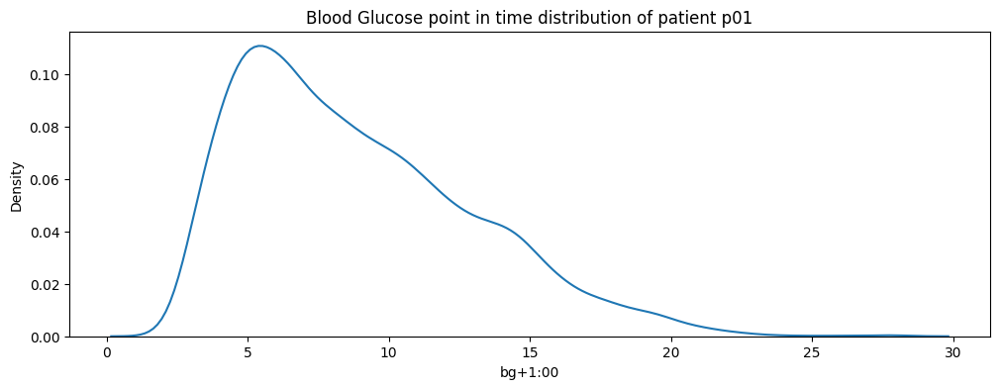

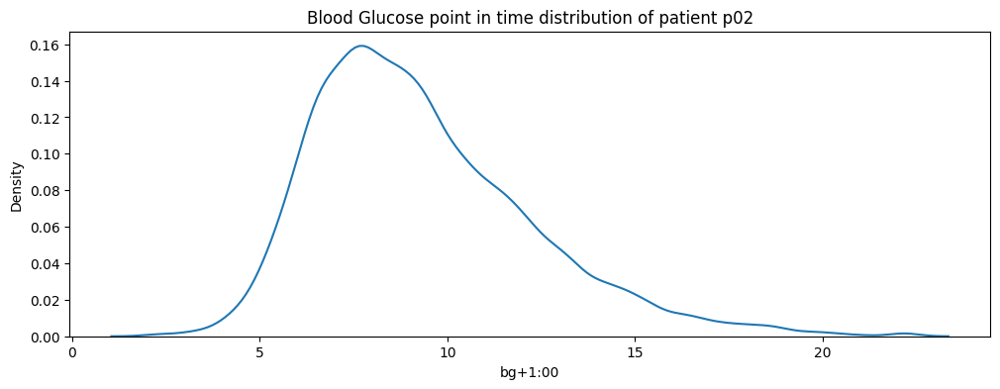

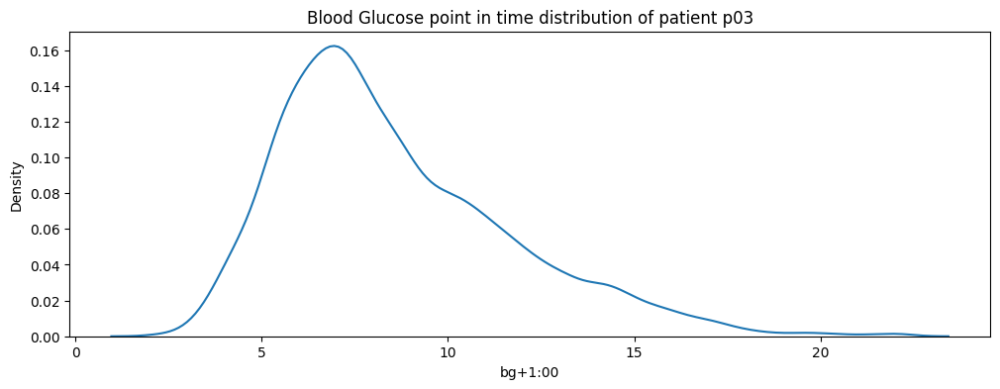

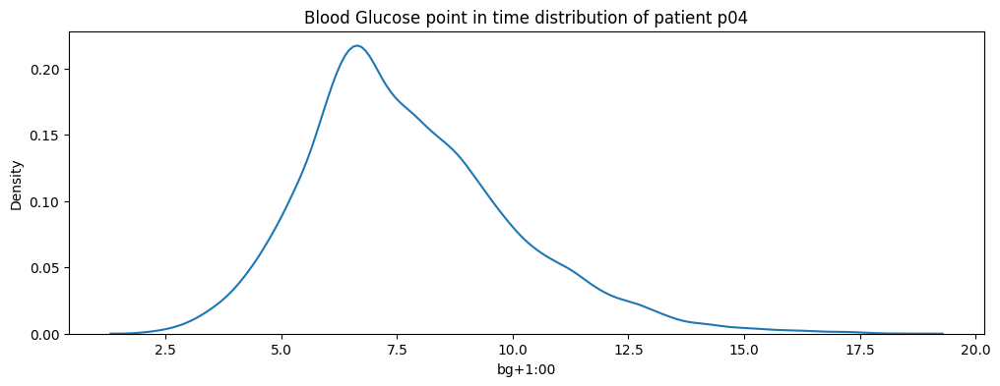

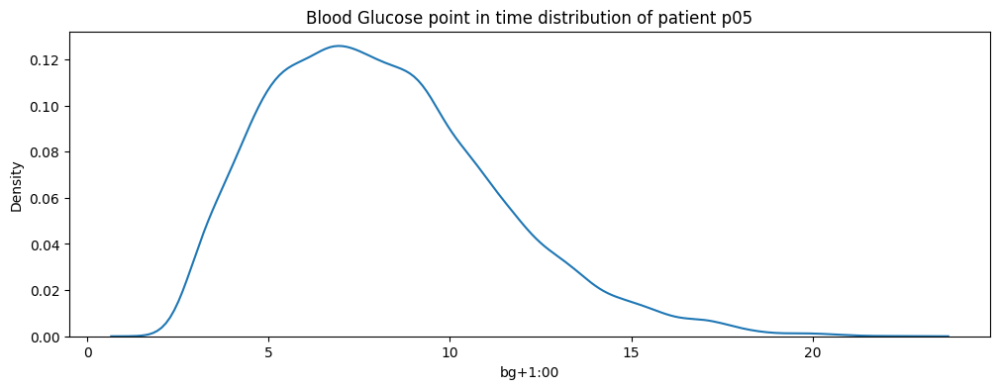

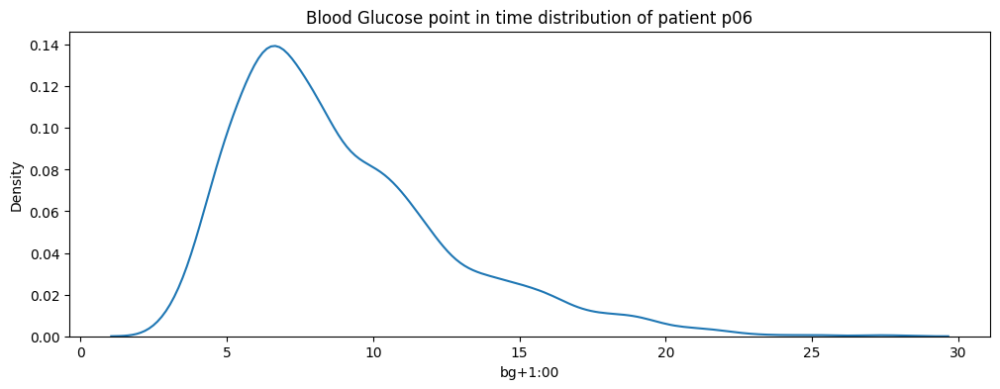

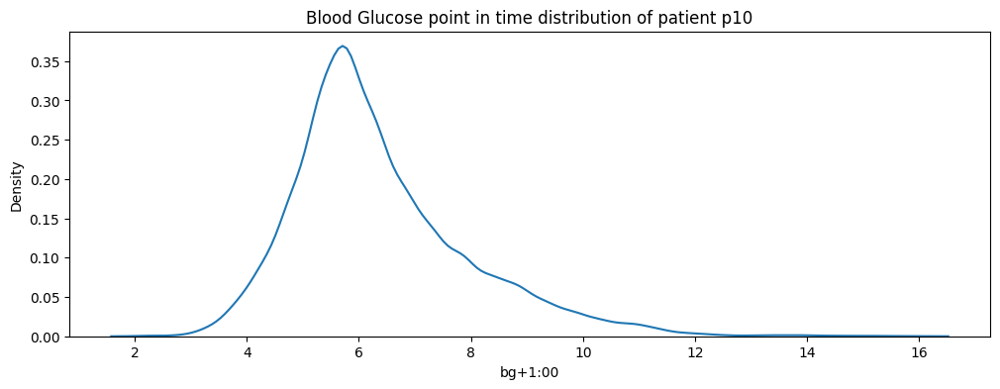

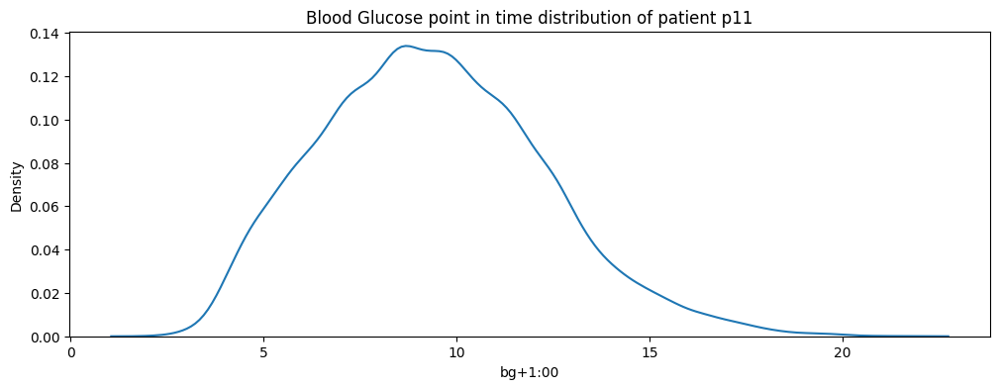

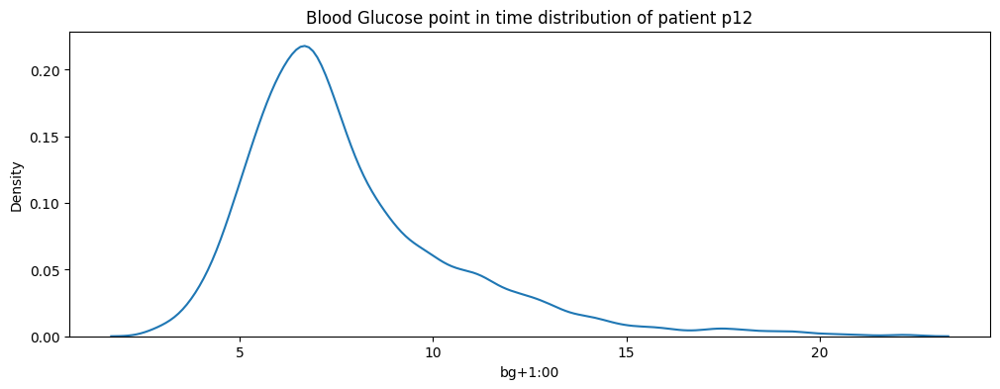

In [41]:
patients = train_df_with_time.p_num.unique()

for patient in train_df_with_time.p_num.unique():
    subset = train_df_with_time[train_df_with_time.p_num == patient]

    plt.figure(figsize=(12,4))
    plt.title(f'Blood Glucose point in time distribution of patient {patient}')
    sns.kdeplot(data=subset, x='bg+1:00')

C:\Users\Sebastian Cuya\AppData\Local\Temp\ipykernel_3748\1514403511.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=subset_1, x='bg-0:00', ax=ax[i, 0])
C:\Users\Sebastian Cuya\AppData\Local\Temp\ipykernel_3748\1514403511.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=subset_1, x='bg-0:00', ax=ax[i, 0])
C:\Users\Sebastian Cuya\AppData\Local\Temp\ipykernel_3748\1514403511.py:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=subset_1, x='bg-0:00', ax=ax[i, 0])
C:\Users\Sebastian Cuya\AppData\Local\Temp\ipykernel_3748\1514403511.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


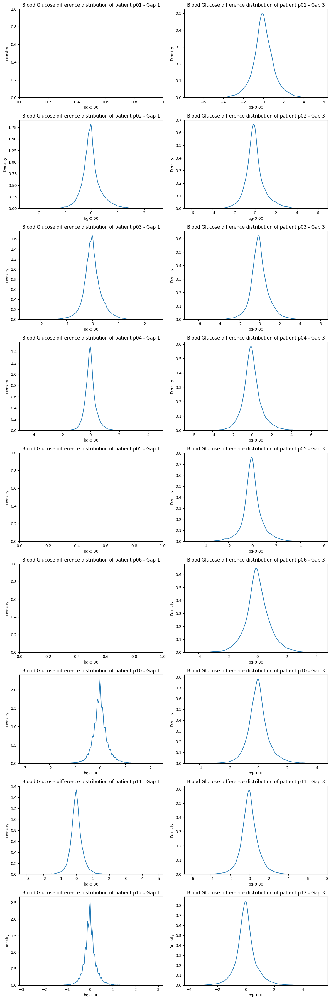

In [51]:
patients = train_df_with_time.p_num.unique()
n_rows = len(patients)
fig, ax = plt.subplots(nrows=n_rows, ncols=2, figsize=(12, 4 * n_rows))
for i, patient in enumerate(train_df_with_time.p_num.unique()):
    subset = train_df_with_time[train_df_with_time.p_num == patient].filter(regex='bg-.*')
    subset_1 = subset.diff(1, axis=1)
    subset_3 = subset.diff(3, axis=1)

    sns.kdeplot(data=subset_1, x='bg-0:00', ax=ax[i, 0])
    ax[i, 0].set_title(f'Blood Glucose difference distribution of patient {patient} - Gap 1')
    
    sns.kdeplot(data=subset_3, x='bg-0:00', ax=ax[i, 1])
    ax[i, 1].set_title(f'Blood Glucose difference distribution of patient {patient} - Gap 3')

fig.tight_layout()
fig.show()

### Blood Glucose as Time Series

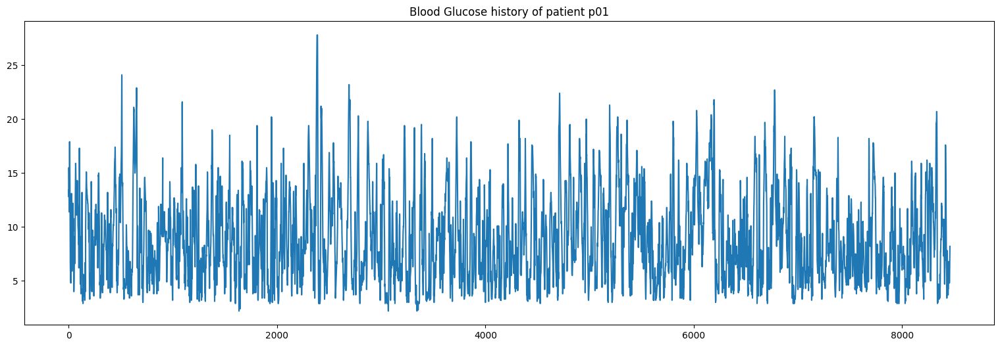

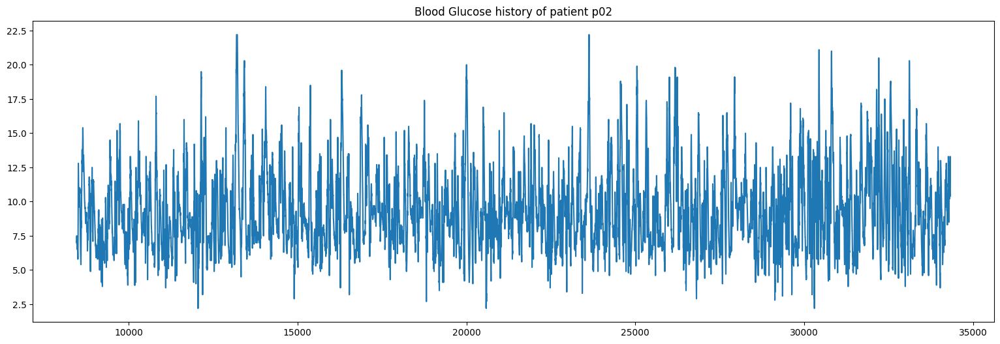

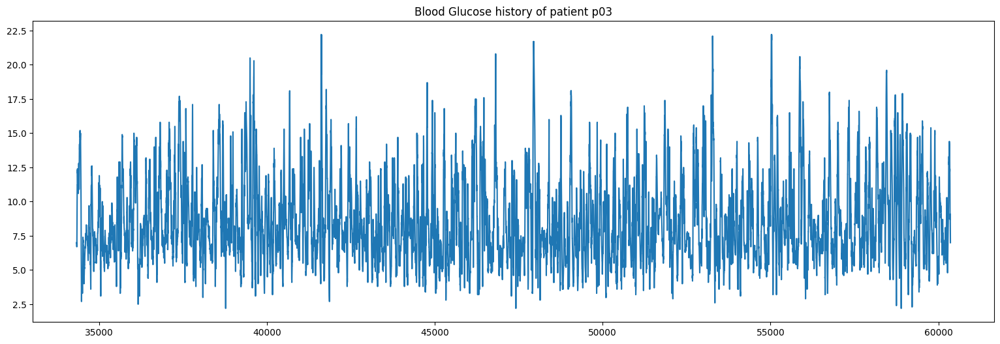

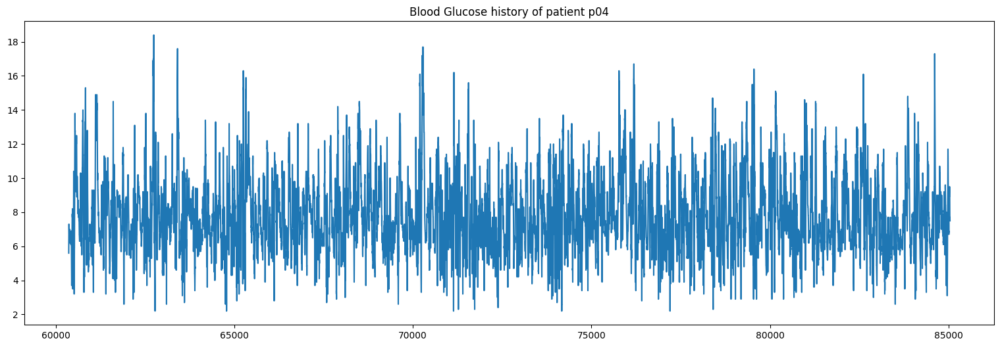

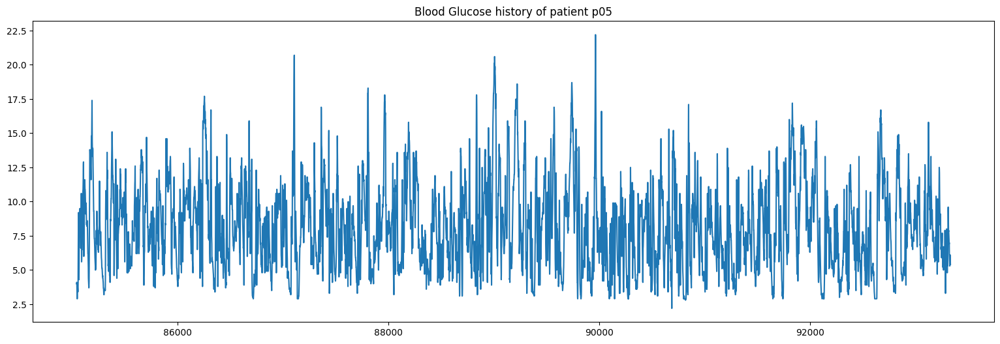

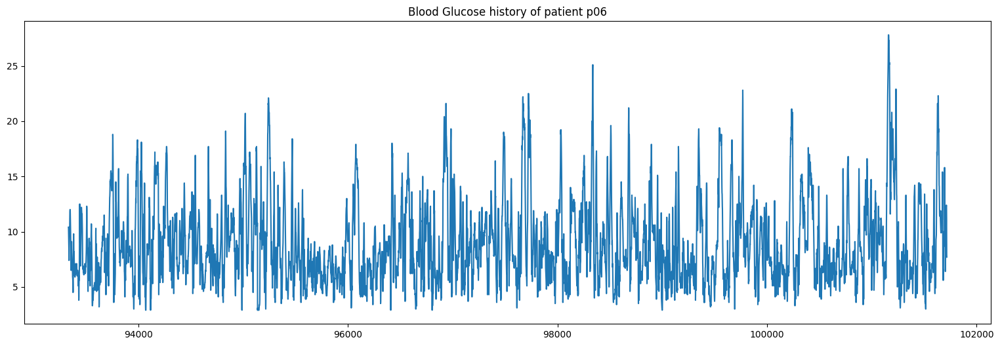

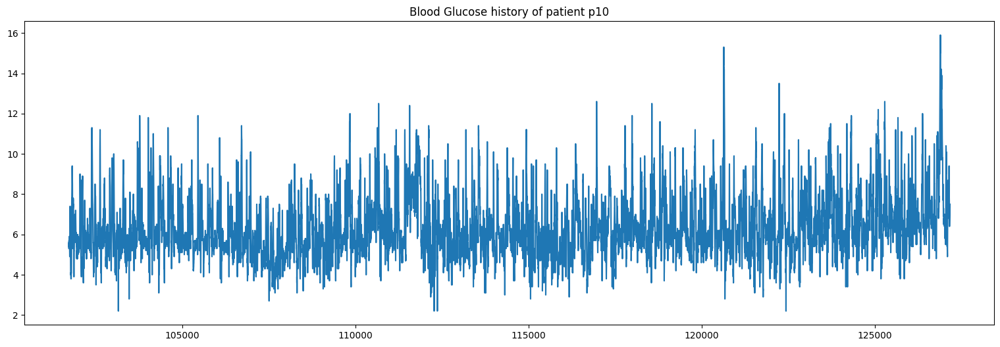

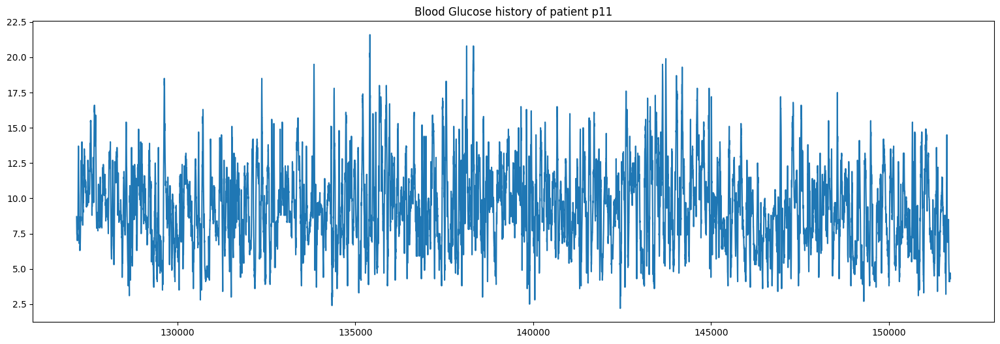

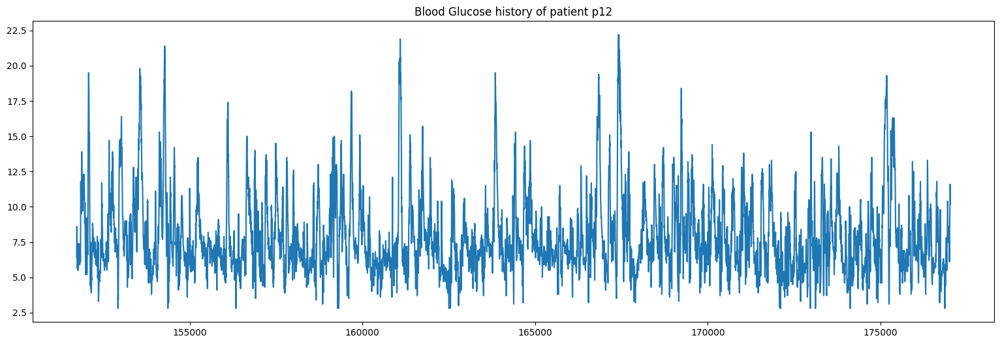

In [29]:
patients_from_test = train_df_with_time.p_num.unique()

for patient in train_df_with_time.p_num.unique():
    subset = train_df_with_time[train_df_with_time.p_num == patient]

    plt.figure(figsize=(19, 6))
    plt.plot(subset['bg+1:00'])
    plt.title(f'Blood Glucose history of patient {patient}')

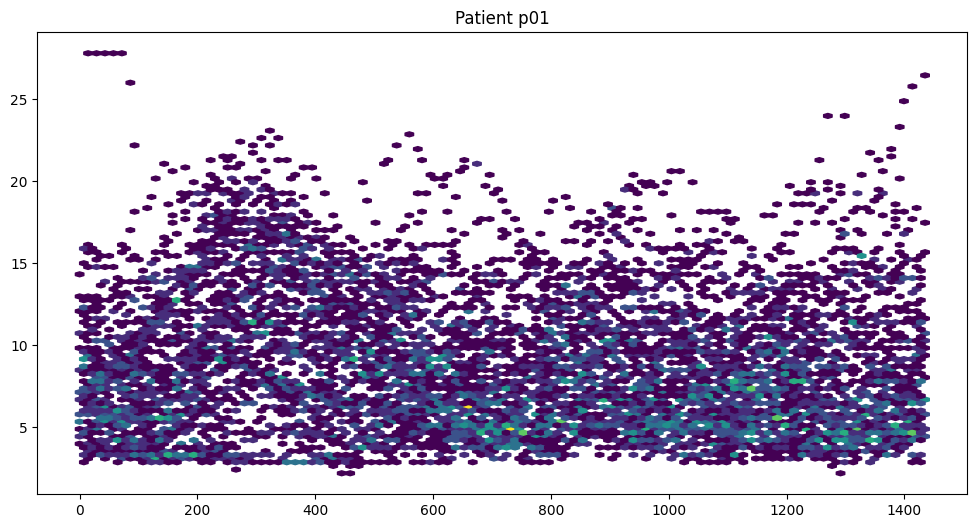

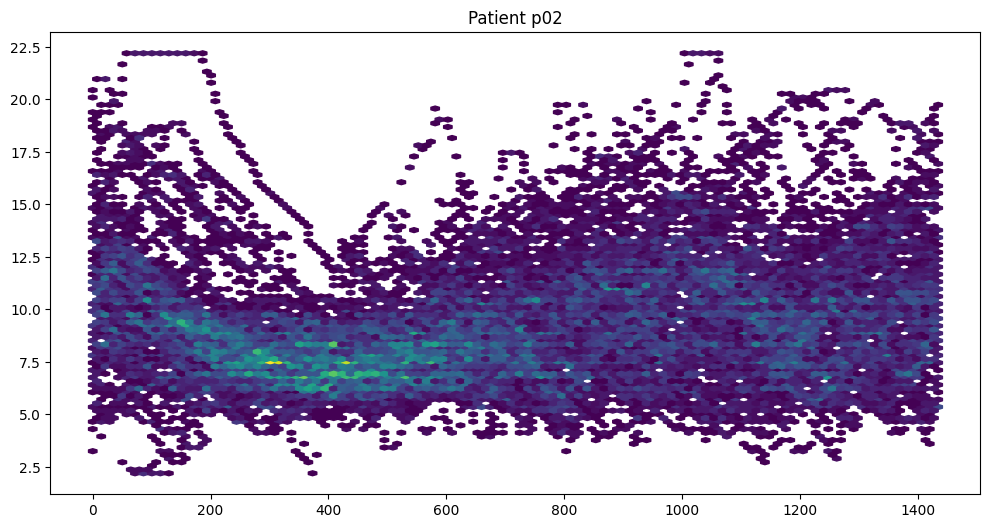

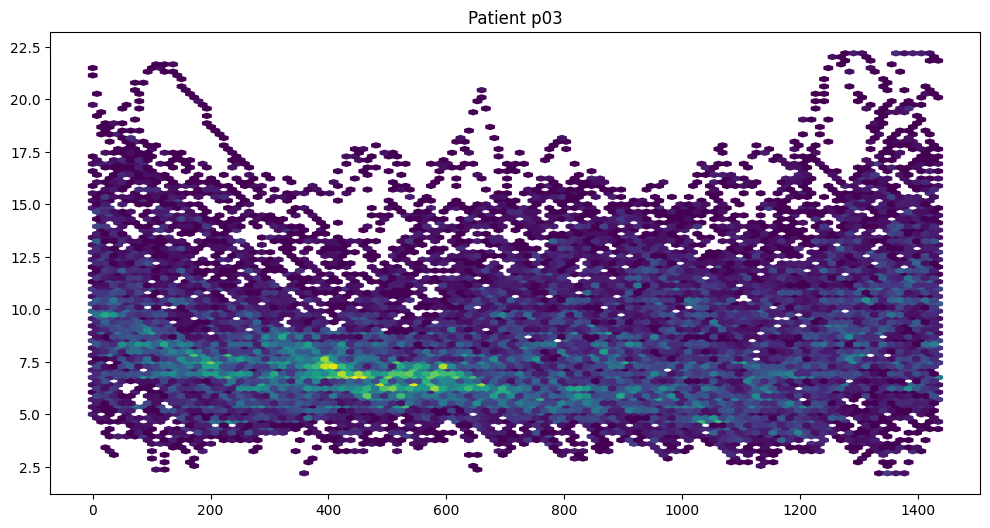

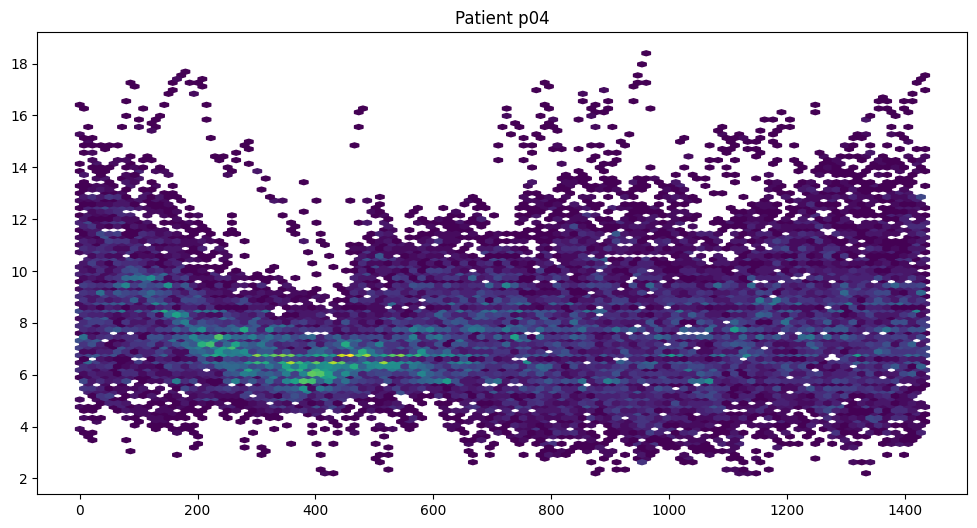

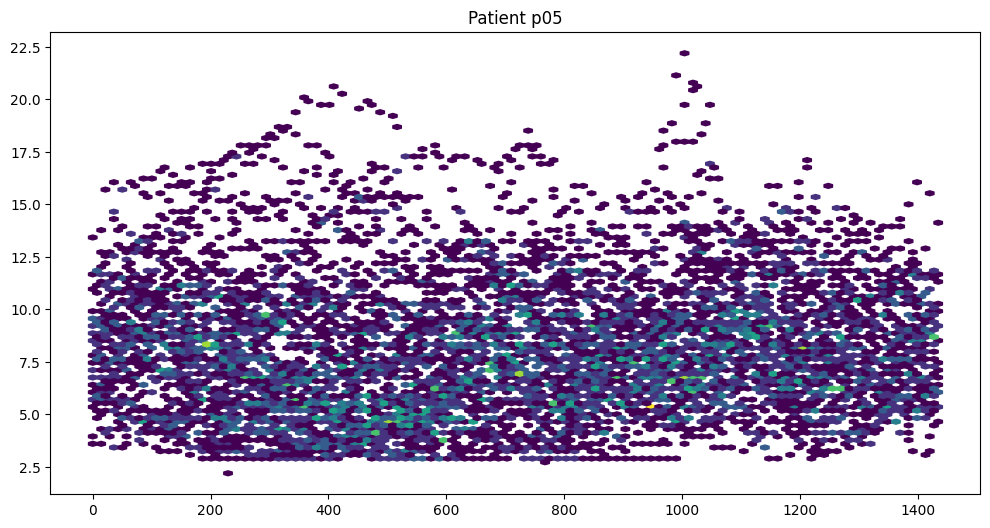

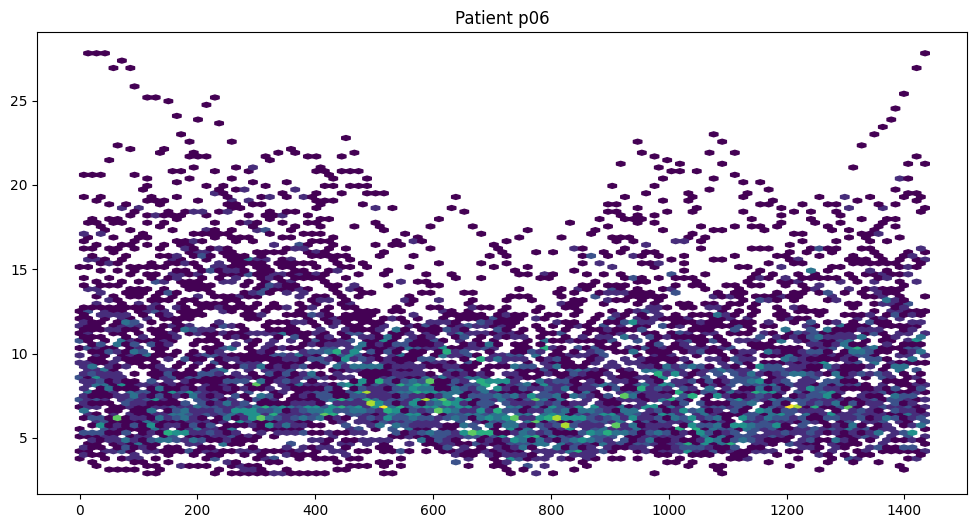

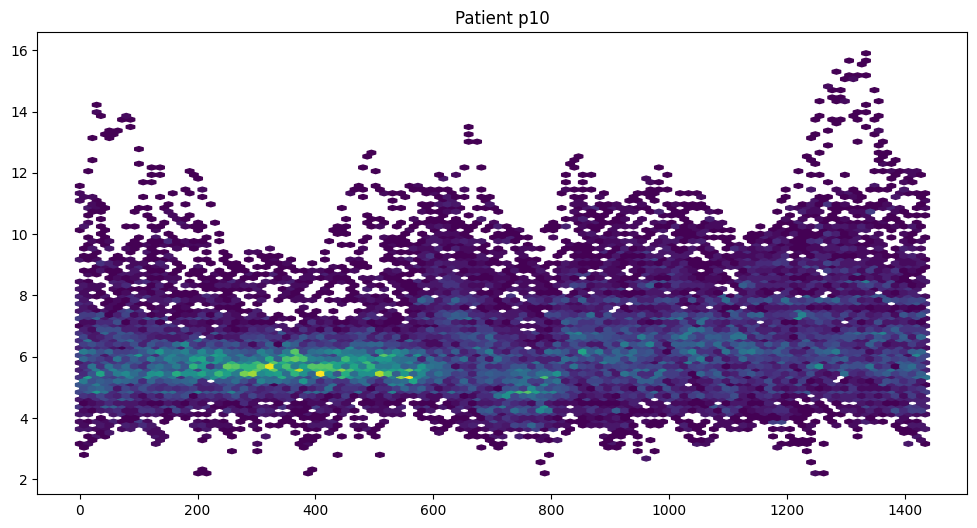

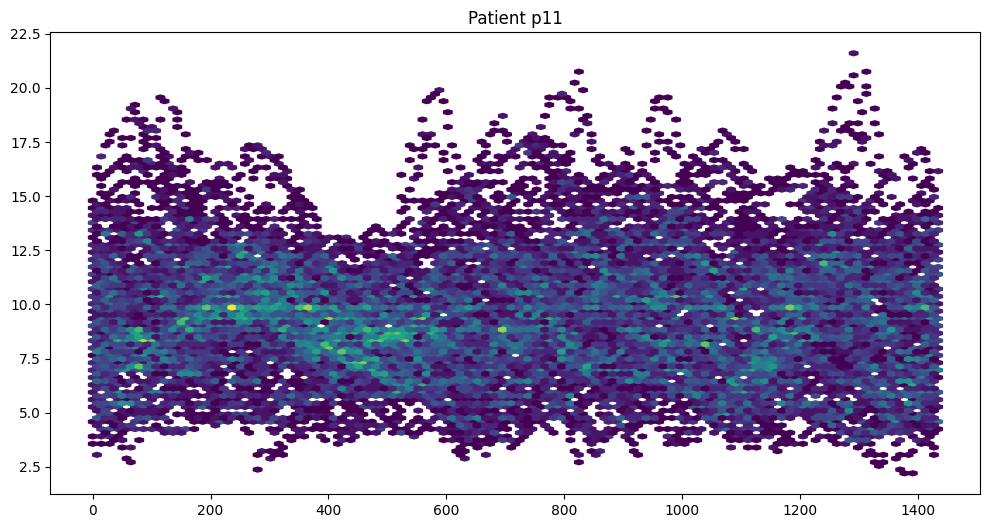

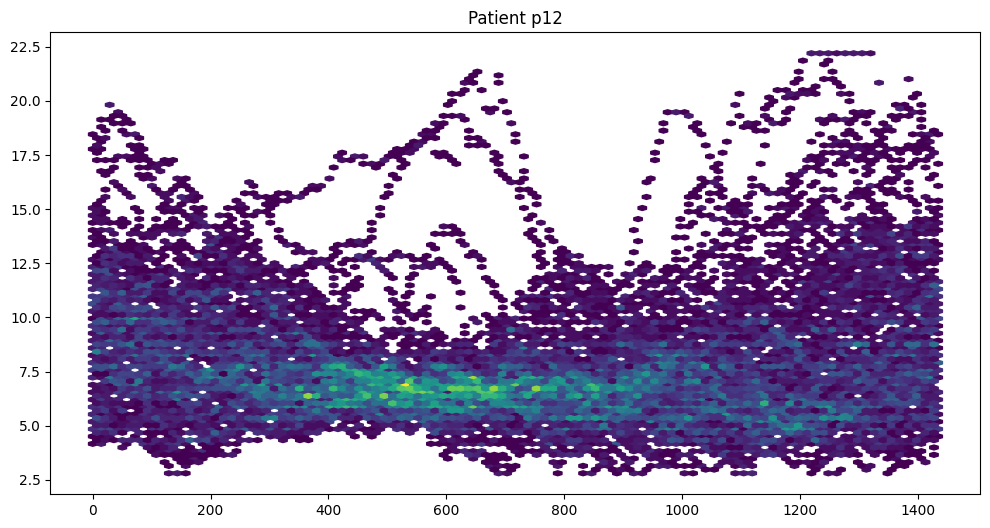

In [31]:
patients = train_df_with_time.p_num.unique()

for patient in train_df_with_time.p_num.unique():
    subset = train_df_with_time[train_df_with_time.p_num == patient]

    plt.figure(figsize=(12,6))
    plt.title(f'Patient {patient}')
    plt.hexbin(x=subset.time_in_seconds, y=subset['bg-0:00'], mincnt=1)

### Correlation, Autocorrelation, Partial Autocorrelation and Cross Correlation

In [55]:
patients = train_df_with_time.p_num.unique()
features = {
    "blood_glucose": "bg-.*", 
    "insulin":"insulin-.*", 
    "carbs": "carbs-.*", 
    "heart_rate": "hr-.*", 
    "steps": "steps-.*", 
    "calories": "cals-.*"
}

for name, regex_filter in features.items():
    corr_pkl_file = Path('.') / f'corr_{name}.pkl'
    corr_target_all = pd.DataFrame()
    for patient in patients:
        subset = train_df_with_time[train_df_with_time.p_num == patient]
        target = subset["bg+1:00"]
        feature_cols = subset.filter(regex=regex_filter, axis=1)
        if name in ['carbs', 'steps']:
            feature_cols = feature_cols.fillna(0)
        if name in ['blood_glucose']:
            feature_cols = feature_cols.interpolate(method='linear', limit_direction='forward', axis=1)
        corr_data_df = pd.concat([feature_cols, target], axis=1)
        corr_df = corr_data_df.corr('spearman')
        corr_target = corr_df["bg+1:00"]
        corr_target = corr_target.drop("bg+1:00")
        corr_target = corr_target.sort_index()
        corr_target.name = f'bg+1:00_{patient}'
        corr_target_all = pd.concat([corr_target_all if not corr_target_all.empty else None, corr_target], axis=1)
    pickle.dump(corr_target_all, open(corr_pkl_file, 'wb'))

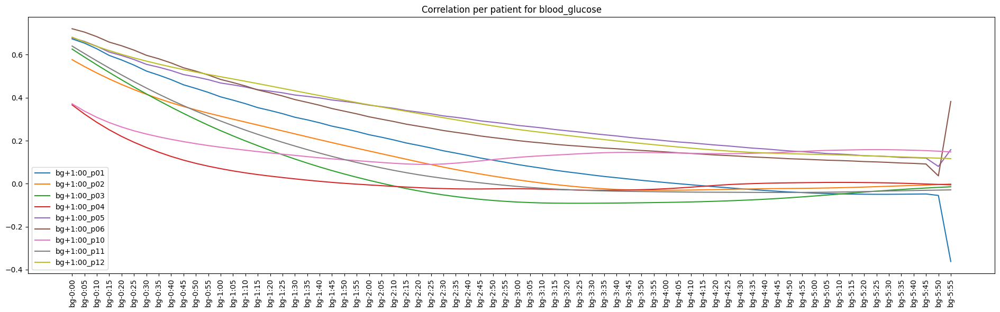

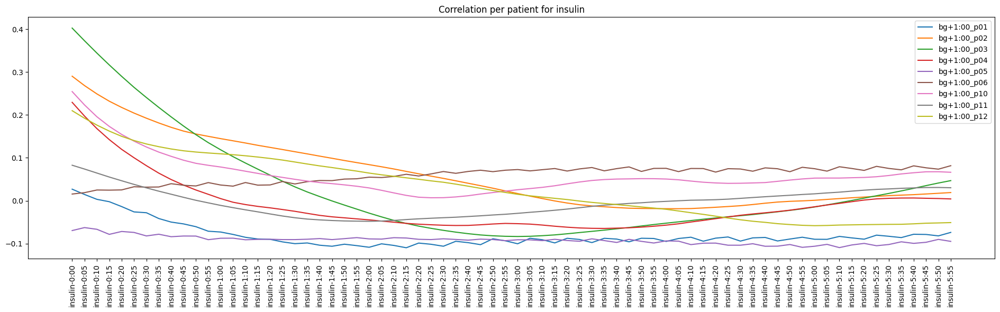

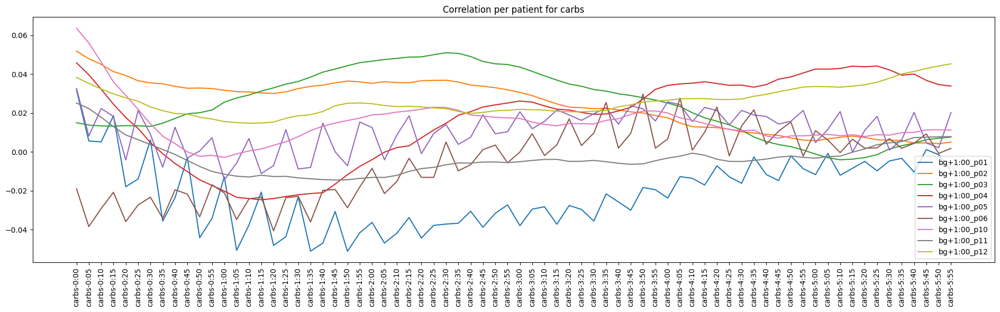

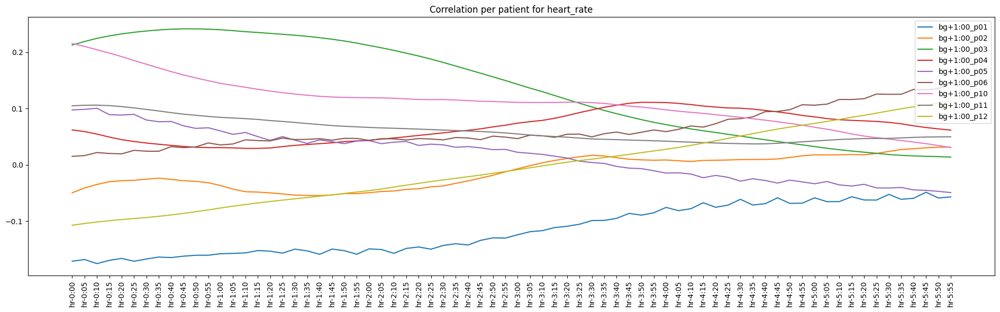

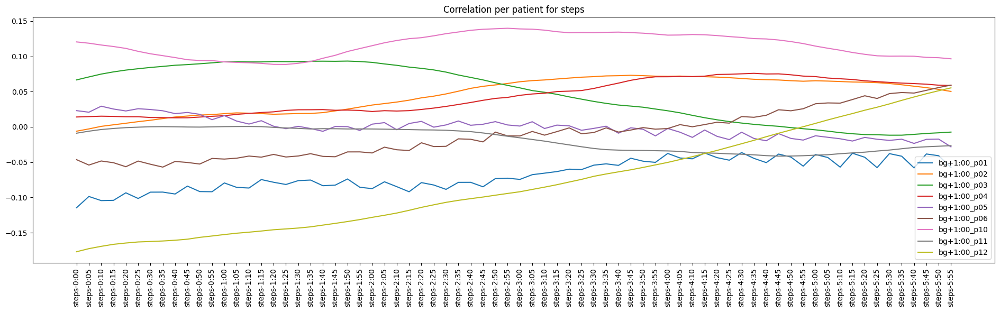

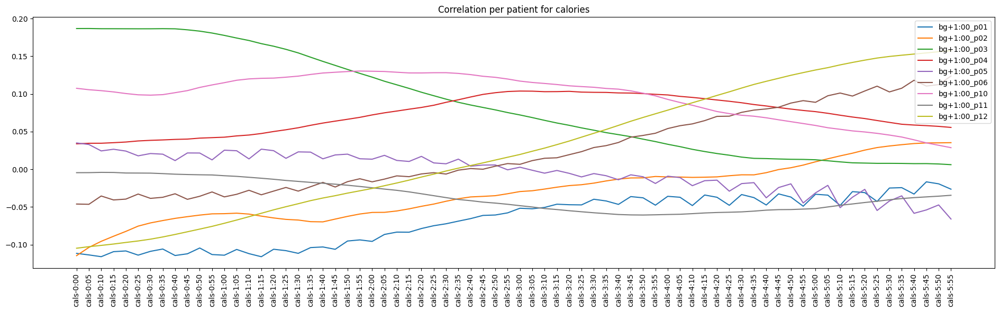

In [56]:
for name, regex_filter in features.items():
    df = pd.read_pickle(Path('.') / f'corr_{name}.pkl')
    plt.figure(figsize=(19,6))
    plt.plot(df, label=df.columns)
    plt.legend()
    plt.xticks(rotation=90)
    plt.title(f'Correlation per patient for {name}')
    plt.tight_layout()
    plt.show()

In [68]:
def get_avg_gap_in_min(row):
    positions = row.index.get_indexer(row.dropna().index)
    if len(positions) <= 1:
        avg_gap_in_min = -1
    else:
        avg_gap_in_min = np.diff(positions).mean() * 5
    return avg_gap_in_min

def get_bg_gap_dict(df):
    bg = df.filter(regex="bg-.*")
    p_num = df.p_num
    avg_gap_in_min = bg.apply(lambda a: get_avg_gap_in_min(a), axis=1)
    avg_gap_in_min.name = 'bg_gap' 
    df_gap = pd.concat([p_num, avg_gap_in_min], axis=1)
    bg_gap = df_gap.groupby('p_num').agg(pd.Series.mode).astype(int).squeeze()
    return bg_gap.to_dict()

In [105]:
def plot_patient_acf(
    df,
    x_identifier,
    patient,
    bg_gap,
    differentiation=False,
    ax=None,
    lags=None,
    alpha=0.05,
    use_vlines=True,
    adjusted=False,
    fft=False,
    missing="none",
    title="Autocorrelation",
    zero=True,
    auto_ylims=False,
    bartlett_confint=True,
    vlines_kwargs=None,
    **kwargs,
):

    subset = df[df.p_num == patient].filter(regex=f'{x_identifier}-.*')
    if x_identifier == 'bg':
        if differentiation:
            subset = subset.interpolate(axis=1, limit=3, limit_direction='forward')
            subset = subset.diff(int(bg_gap/5), axis=1)
            subset = subset.fillna(0)
        else:
            subset = subset.interpolate(axis=1, limit=3, limit_direction='forward')
            
    subset = subset.iloc[:,::-1].iloc[:,::int(bg_gap/5)].iloc[:,::-1].iloc[::int(360/bg_gap),:]
    subset = subset.dropna(axis=0).dropna()
    
    
    n_obs, n_length  = subset.shape

    lags, nlags, irregular = _prepare_data_corr_plot(subset.mean(axis=0), lags, zero)
    
    acf_X = subset.apply(lambda x: acf(x, nlags=nlags, fft=fft, alpha=alpha)[0], axis=1, result_type='expand')
    acf_X = acf_X[~np.isnan(acf_X).any(axis=1)]
    acf_x = acf_X.mean(axis=0)
    confint = np.array([[v - norm.ppf(1 - alpha/2) / np.sqrt(n_length), v + norm.ppf(1 - alpha/2) / np.sqrt(n_length)] for v in acf_x])

    
    
    fig, ax = statsmodels.graphics.utils.create_mpl_ax(ax)
    vlines_kwargs = {} if vlines_kwargs is None else vlines_kwargs

    title=f"Autocorrelation of {x_identifier} for patient {patient} - Gap of {bg_gap} min"

    _plot_corr(
        ax,
        title,
        acf_x,
        confint,
        lags,
        irregular,
        use_vlines,
        vlines_kwargs,
        **kwargs,
    )

    return fig

In [106]:
def plot_patient_pacf(
    df,
    x_identifier,
    patient,
    bg_gap,
    differentiation=False,
    ax=None,
    lags=None,
    alpha=0.05,
    method="ywm",
    use_vlines=True,
    title="Partial Autocorrelation",
    zero=True,
    irregular=True,
    vlines_kwargs=None,
    **kwargs,
):

    subset = df[df.p_num == patient].filter(regex=f'{x_identifier}-.*')
    if x_identifier == 'bg':
        if differentiation:
            subset = subset.interpolate(axis=1, limit=3, limit_direction='forward')
            subset = subset.diff(int(bg_gap/5), axis=1)
            subset = subset.fillna(0)
        else:
            subset = subset.interpolate(axis=1, limit=3, limit_direction='forward')
            
    subset = subset.iloc[:,::-1].iloc[:,::int(bg_gap/5)].iloc[:,::-1].iloc[::int(360/bg_gap),:]
    subset = subset.dropna(axis=0).dropna() 
    
    n_obs, n_length  = subset.shape

    lags, nlags, irregular = _prepare_data_corr_plot(subset.mean(axis=0), lags, zero)

    pacf_X = subset.apply(lambda x: pacf(x, nlags, method, alpha)[0], axis=1, result_type='expand')
    pacf_X = pacf_X[~np.isnan(pacf_X).any(axis=1)]
    pacf_x = pacf_X.mean(axis=0)
    confint = np.array([[v - norm.ppf(1 - alpha/2) / np.sqrt(n_length), v + norm.ppf(1 - alpha/2) / np.sqrt(n_length)] for v in pacf_x])
    
    fig, ax = statsmodels.graphics.utils.create_mpl_ax(ax)
    vlines_kwargs = {} if vlines_kwargs is None else vlines_kwargs

    title=f"Partial Autocorrelation of {x_identifier} for patient {patient} - Gap of {bg_gap} min"

    _plot_corr(
        ax,
        title,
        pacf_x,
        confint,
        lags,
        irregular,
        use_vlines,
        vlines_kwargs,
        **kwargs,
    )

    return fig

In [109]:
def plot_patient_ccf(
        df,
        y_identifier,
        patient,
        bg_gap,
        differentiation=False,
        standarization=False,
        ax=None,
        lags=None,
        negative_lags=False,
        alpha=0.05,
        use_vlines=True,
        adjusted=False,
        fft=False,
        title="Cross-correlation",
        auto_ylims=False,
        vlines_kwargs=None,
        **kwargs,
):
    subset_X = df[df.p_num == patient].filter(regex='bg-.*')
    if differentiation:
        subset_X = subset_X.interpolate(axis=1, limit=3, limit_direction='forward')
        subset_X = subset_X.diff(int(bg_gap/5), axis=1)
        subset_X = subset_X.fillna(0)
    else:
        subset_X = subset_X.interpolate(axis=1, limit=3, limit_direction='forward')
            
    subset_X = subset_X.iloc[:,::-1].iloc[:,::int(bg_gap/5)].iloc[:,::-1].iloc[::int(360/bg_gap),:]
    subset_X = subset_X.dropna(axis=0).dropna() 

    subset_Y = df[df.p_num == patient].filter(regex=f'{y_identifier}-.*')
    if y_identifier == 'insulin':
        subset_Y = subset_Y.where(subset_Y == subset_Y.ffill(axis=1), 0).where(subset_Y.ffill(axis=1) == subset_Y.ffill(axis=1).bfill(axis=1))
    else:
        subset_Y = subset_Y.fillna(0)
    subset_Y = subset_Y.T.rolling(window=int(bg_gap/5)).sum().T
    subset_Y = subset_Y.iloc[:,::-1].iloc[:,::int(bg_gap/5)].iloc[:,::-1].iloc[::int(360/bg_gap),:]
    subset_Y = subset_Y.dropna()

    subset_X = subset_X[subset_X.index.isin(subset_Y.index)]
    subset_Y = subset_Y[subset_Y.index.isin(subset_X.index)]

    if standarization:
        X_mean = subset_X.iloc[:, -1].mean()
        X_std = subset_X.iloc[:, -1].std()
        subset_X = (subset_X - X_mean)/X_std

        Y_mean = subset_Y.iloc[:, -1].mean()
        Y_std = subset_Y.iloc[:, -1].std()
        subset_Y = (subset_Y - Y_mean)/Y_std

    n_obs, n_length  = subset_X.shape
    ccf_XY = np.zeros((n_obs, int(n_length/2) + 1))
    
    lags, nlags, irregular = _prepare_data_corr_plot(subset_X.mean(axis=0), lags, True)
    
    for i, ((idx_X, row_x), (idx_y, row_y)) in enumerate(zip(subset_X.iterrows(), subset_Y.iterrows())):
        ccf_xy_row = ccf(row_x, row_y, nlags=nlags + 1, adjusted=adjusted, fft=fft, alpha=alpha)[0]
        ccf_XY[i] = ccf_xy_row

    ccf_XY = ccf_XY[~np.isnan(ccf_XY).any(axis=1)]
    ccf_xy = ccf_XY.mean(axis=0)
    confint = np.array([[v - norm.ppf(1 - alpha/2) / np.sqrt(n_length), v + norm.ppf(1 - alpha/2) / np.sqrt(n_length)] for v in ccf_xy])
    
    fig, ax = statsmodels.graphics.utils.create_mpl_ax(ax)
    vlines_kwargs = {} if vlines_kwargs is None else vlines_kwargs

    title=f"Cross-correlation bg-{y_identifier} for patient {patient} - Gap of {bg_gap} min"

    _plot_corr(
        ax,
        title,
        ccf_xy,
        confint,
        lags,
        irregular,
        use_vlines,
        vlines_kwargs,
        auto_ylims=auto_ylims,
        skip_lag0_confint=False,
        **kwargs,
    )

    return fig

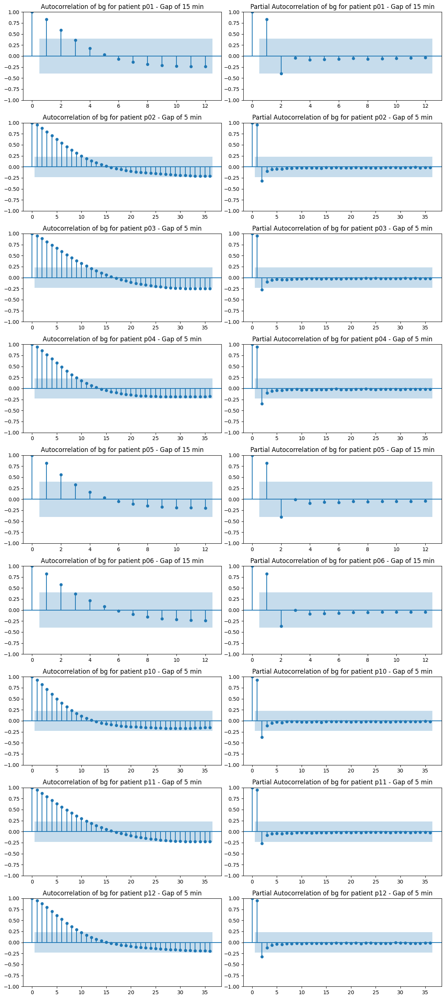

In [110]:
# Without differentiation

patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(12, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 2, 2 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_acf(train_df, 'bg', patient, bg_gap, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 2, 2 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_pacf(train_df, 'bg', patient, bg_gap, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

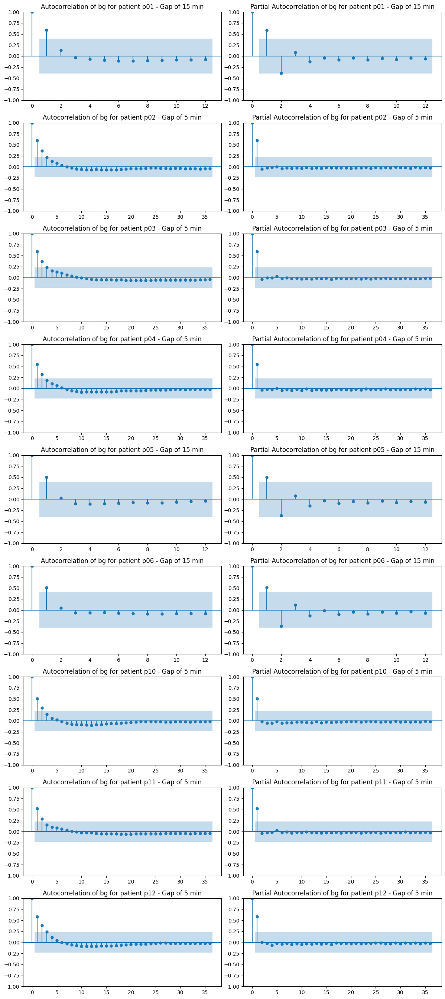

In [120]:
# With differentiation

patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(12, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 2, 2 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_acf(train_df, 'bg', patient, bg_gap, differentiation=True, lags=int(360/bg_gap/2) , ax=ax);

    ax = plt.subplot(n_patients, 2, 2 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_pacf(train_df, 'bg', patient, bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\statt

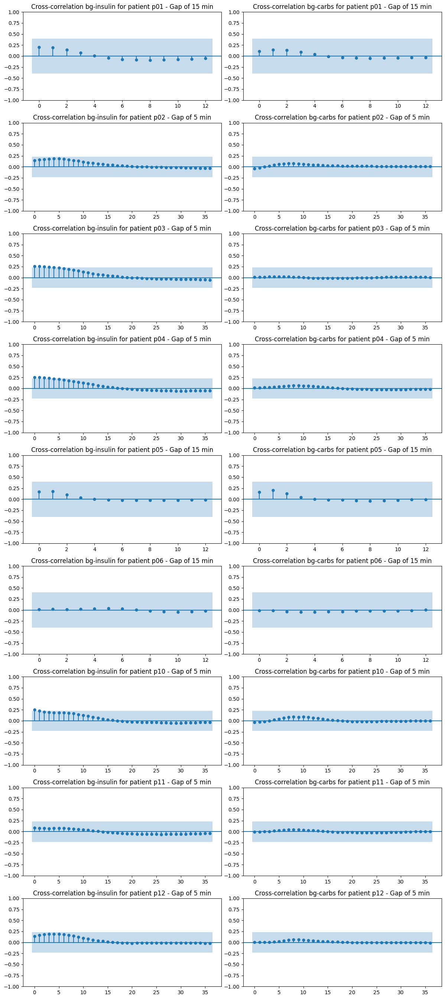

In [ ]:
patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(18, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 2, 2 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='insulin', patient=patient, bg_gap=bg_gap, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 2, 2 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='carbs', patient=patient, bg_gap=bg_gap, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\statt

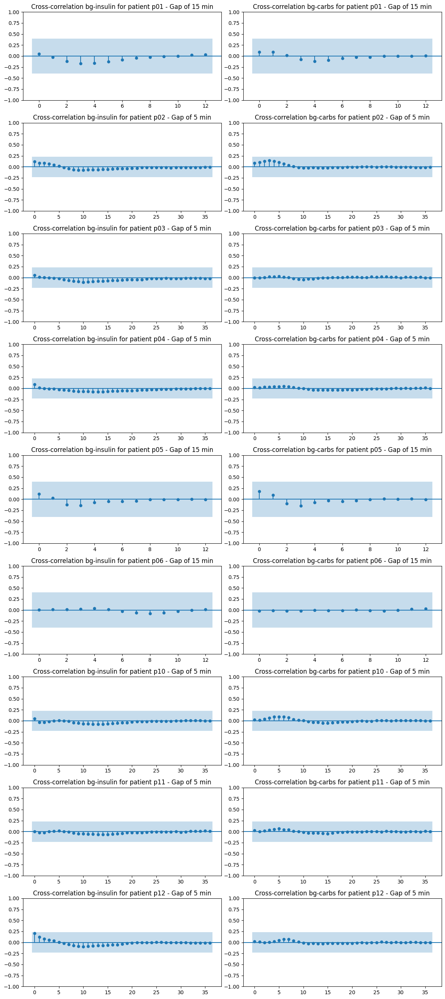

In [113]:
patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(12, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 2, 2 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='insulin', patient=patient, bg_gap=bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 2, 2 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='carbs', patient=patient, bg_gap=bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\statt

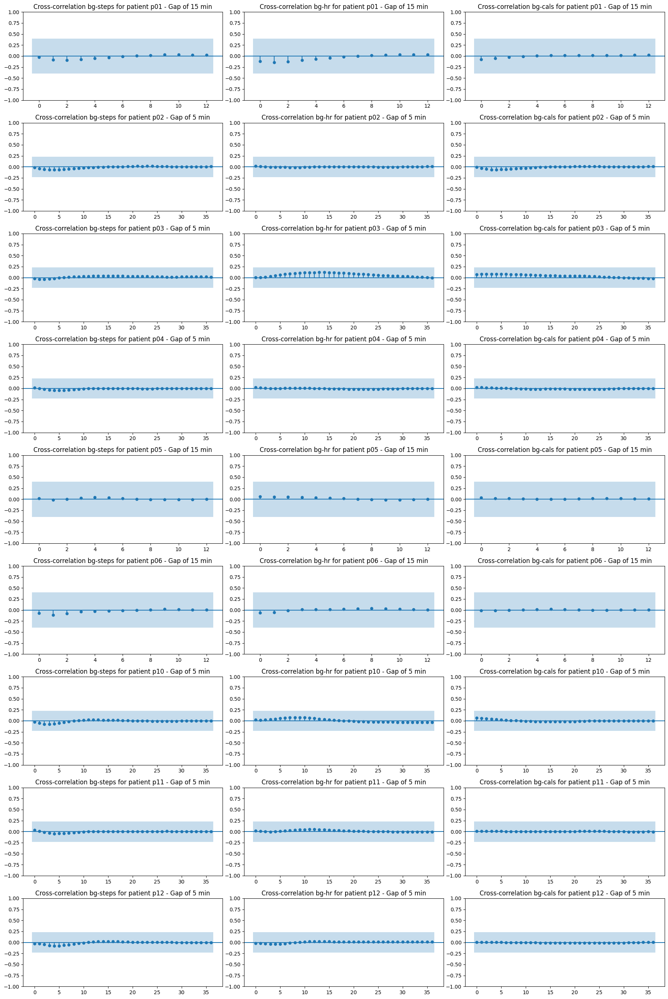

In [121]:
patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(18, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 3, 3 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='steps', patient=patient, bg_gap=bg_gap, differentiation=False, lags=int(360/bg_gap/2), ax=ax);


    ax = plt.subplot(n_patients, 3, 3 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='hr', patient=patient, bg_gap=bg_gap, differentiation=False, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 3, 3 * i + 3)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='cals', patient=patient, bg_gap=bg_gap, differentiation=False, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\stattools.py:1179: RuntimeWarning: invalid value encountered in divide
  ret = cvf / (np.std(x) * np.std(y))
c:\Users\Sebastian Cuya\Documents\Programming Projects\Kaggle\kaggle_competitions\brist1d_blood_glucose_prediction_competition\.venv\Lib\site-packages\statsmodels\tsa\statt

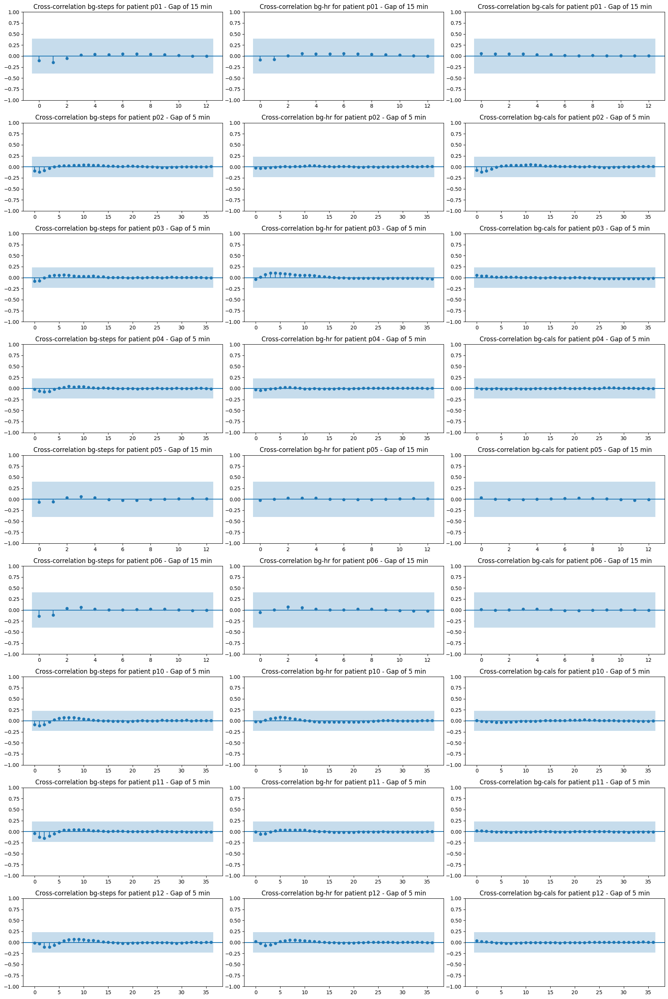

In [122]:
patient_gap_dict = get_bg_gap_dict(train_df)
patients_list = sorted(train_df.p_num.unique())
n_patients = len(patients_list)

plt.figure(figsize=(18, 3*n_patients))

for i, patient in enumerate(patients_list):
    ax = plt.subplot(n_patients, 3, 3 * i + 1)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='steps', patient=patient, bg_gap=bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 3, 3 * i + 2)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='hr', patient=patient, bg_gap=bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

    ax = plt.subplot(n_patients, 3, 3 * i + 3)
    bg_gap = patient_gap_dict[patient]
    plot_patient_ccf(df=train_df, y_identifier='cals', patient=patient, bg_gap=bg_gap, differentiation=True, lags=int(360/bg_gap/2), ax=ax);

plt.tight_layout()
plt.show()

## Feature Importance

In [12]:
def plot_feature_importances(model, top_n=None):
    # Check model type and get feature importances and feature names
    if hasattr(model, 'get_feature_importance'):
        # For CatBoost models
        importances = model.get_feature_importance()
        feature_names = model.feature_names_
    elif hasattr(model, 'feature_importances_'):
        # For LightGBM and XGBoost models
        importances = model.booster_.feature_importance(importance_type='gain')
        if hasattr(model, 'get_booster'):
            feature_names = model.get_booster().feature_names
        elif hasattr(model, 'feature_names_in_'):
            feature_names = model.feature_names_in_  # For LightGBM when trained with a DataFrame
        else:
            feature_names = model.feature_name_  # For LightGBM when trained with a DataFrame
    elif hasattr(model, 'get_score'):
        # For XGBoost if trained via DMatrix (returns dictionary)
        score = model.get_score(importance_type='weight')
        importances = list(score.values())
        feature_names = list(score.keys())

    else:
        raise ValueError("Model does not have feature importances attribute or method.")
    
    # Sort features by importance
    indices = np.argsort(importances)[::-1]
    
    if top_n:
        indices = indices[:top_n]
    
    sorted_importances = np.array(importances)[indices]
    sorted_feature_names = np.array(feature_names)[indices]

    # Plot the feature importances
    plt.figure(figsize=(8, 6))
    plt.barh(sorted_feature_names, sorted_importances, color='skyblue')
    plt.xlabel('Feature Importance')
    plt.title('Feature Importances')
    plt.gca().invert_yaxis()  # Invert to display highest importance at top
    plt.tight_layout()
    plt.show()

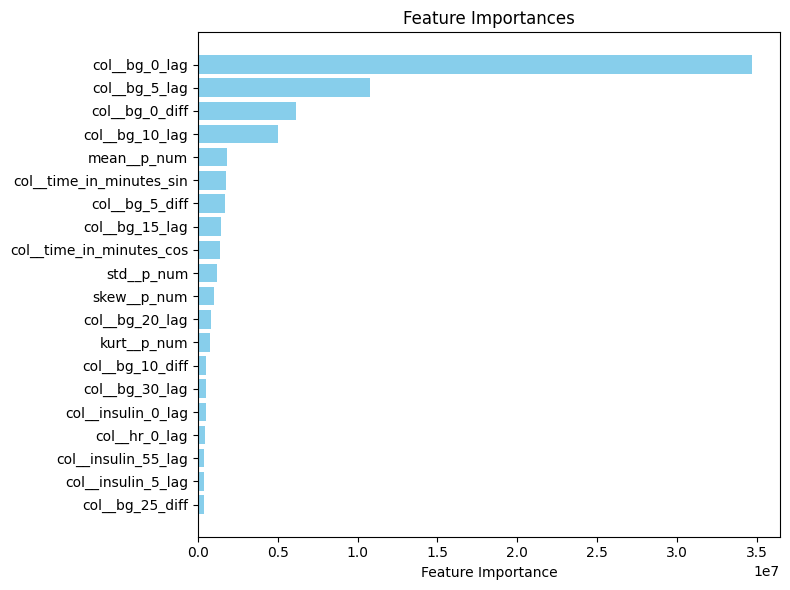

In [16]:
gap = 1
n_prior = 12
addition = 0
regressor_type = 'lgbm'
suffix = 'standard'

with open(Path('../') / Path(MODEL_DIR) / f'{regressor_type}_gap_{gap}_prior_{n_prior}_addition_{addition}_pipeline_{suffix}.pkl', "rb") as input_params_file:
    pipeline = pickle.load(input_params_file)

regressor = pipeline.named_steps['regressor']

plot_feature_importances(regressor, top_n=20)

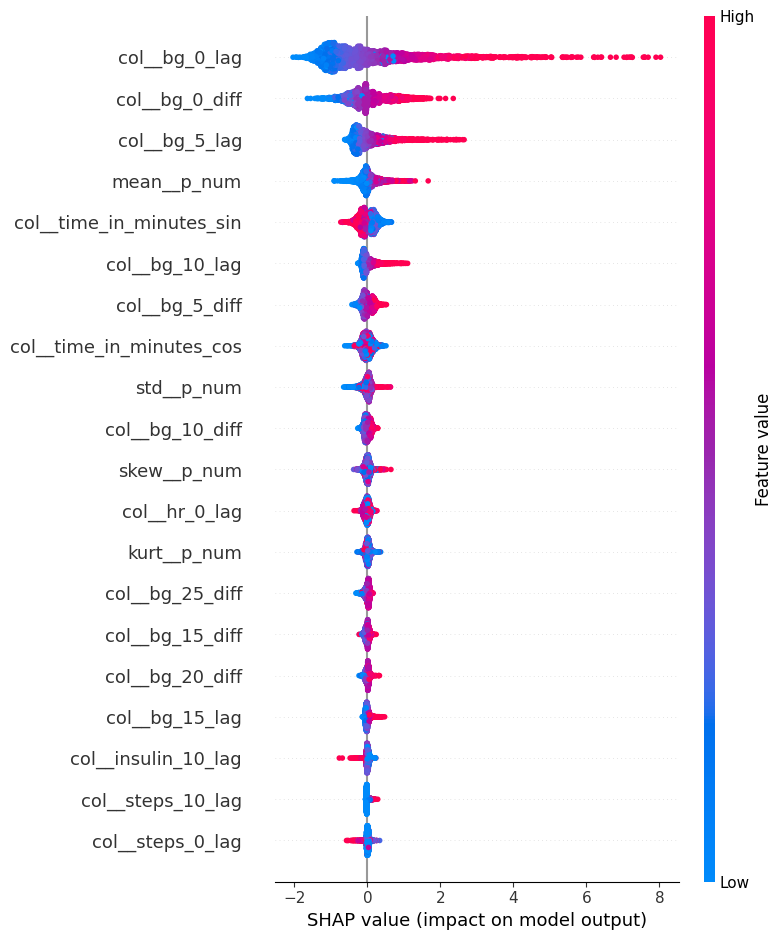

In [9]:
gap = 1
n_prior = 12
addition = 0
regressor_type = 'lgbm'
suffix = 'standard'

with open(Path('../') / Path(MODEL_DIR) / f'{regressor_type}_gap_{gap}_prior_{n_prior}_addition_{addition}_pipeline_{suffix}.pkl', "rb") as input_params_file:
    pipeline = pickle.load(input_params_file)

transformer = pipeline.named_steps['transform']
regressor = pipeline.named_steps['regressor']

X_test = pd.read_pickle(Path('../') / Path(PROCESSED_DATA_DIR) / f'X_test_gap_{gap}_prior_{n_prior}_addition_{addition}.pkl')
X_test_transformed = transformer.transform(X_test)

explainer = shap.TreeExplainer(regressor)
shap_values = explainer(X_test_transformed)
shap.summary_plot(shap_values, X_test_transformed, max_display=20)